# MDA 2022 - Project
## Abolfazl Yarian (400205641)
-----------------------------------------------------------------

## Initializing Spark and read data

In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
from datetime import datetime
import numpy as np
import random
import itertools
from scipy.spatial.distance import jaccard, cosine

In [2]:
from pyspark import SparkContext, SparkConf 
from pyspark.sql import SparkSession
from pyspark.sql.types import StructType,StructField, StringType, IntegerType,TimestampType
from pyspark.sql.functions import col,current_timestamp,to_date,hour,dayofweek
spark = SparkSession \
    .builder \
    .appName("MDA2022-Project") \
    .master("local[*]") \
    .getOrCreate()

sc=spark.sparkContext

schema = StructType([ \
        StructField("DEVICE_CODE", IntegerType(), True), 
        StructField("SYSTEM_ID",IntegerType(),True), \
        StructField("ORIGINE_CAR_KEY",StringType(),True), \
        StructField("FINAL_CAR_KEY",StringType(),True), \
        StructField("CHECK_STATUS_KEY", IntegerType(), True), \
        StructField("COMPANY_ID", StringType(), True), \
        StructField("PASS_DAY_TIME", TimestampType(), True)
    ])

23/02/09 21:39:08 WARN Utils: Your hostname, user01-virtual-machine resolves to a loopback address: 127.0.1.1; using 213.233.181.158 instead (on interface ens160)
23/02/09 21:39:08 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address


Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


23/02/09 21:39:08 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
23/02/09 21:39:09 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.


## Pre-Processing

In [3]:
# read traffic data as a dataframe
df = spark.read.csv("MDA2022ProjectData.csv", header=True, schema=schema)

# remove enforcement camera
df = df.filter((df.SYSTEM_ID == 84) | (df.SYSTEM_ID == 283) | (df.SYSTEM_ID == 284))
df.show(5)

+-----------+---------+---------------+-------------+----------------+----------+-------------------+
|DEVICE_CODE|SYSTEM_ID|ORIGINE_CAR_KEY|FINAL_CAR_KEY|CHECK_STATUS_KEY|COMPANY_ID|      PASS_DAY_TIME|
+-----------+---------+---------------+-------------+----------------+----------+-------------------+
|   22010047|      284|       63455590|     63455590|               6|       161|2021-12-22 00:59:30|
|   22010054|      284|       63566637|     64111706|               7|       161|2021-12-22 01:24:58|
|   22010057|      284|       63653636|     63653636|               6|       161|2021-12-22 00:46:37|
|   22010039|      284|       63562975|     64111706|               7|       161|2021-12-22 00:27:32|
|   22010053|      284|       63634047|     64111706|               7|       161|2021-12-22 01:29:24|
+-----------+---------+---------------+-------------+----------------+----------+-------------------+
only showing top 5 rows



In [4]:
# The 22nd and 23rd of January, which are Thursday and Friday, have been removed from the dataset.
# As a result of this work, I have data for four weeks and the dataset is balanced
data_rdd = df.rdd.filter(lambda x: (x['PASS_DAY_TIME'].date().day != 22) and (x['PASS_DAY_TIME'].date().day != 23))

In [32]:
# Find a list of cars that have passed over 1000 cameras or more
top_car_candidate = data_rdd.map(lambda x: (x['ORIGINE_CAR_KEY'],1)).reduceByKey(lambda x,y : x+y).top(1000, key= lambda x: x[1])
top_car_candidate[:10]

[('69177480', 290428),
 ('8073331', 159059),
 ('7633319', 1961),
 ('7682972', 1673),
 ('26516372', 1454),
 ('12481252', 1372),
 ('8552081', 1270),
 ('23660341', 1251),
 ('21118149', 1238),
 ('15147933', 1236)]

In [33]:
# remove fault item
top_car = [i[0] for i in top_car_candidate[2:]]
top_car[:10]

['7633319',
 '7682972',
 '26516372',
 '12481252',
 '8552081',
 '23660341',
 '21118149',
 '15147933',
 '11054045',
 '9590687']

In [ ]:
# sample = data_rdd1.sample(withReplacement=False, fraction=0.01, seed=10).collect()
# data_rdd = sc.parallelize(sample)

# 1 - Traffic Histograms:

In [34]:
# create a RDD with key=car_key and values=(deviceCode, passDayTime) : list of device codes that captured the car with time
# We sorted the values by time to compute pairs camera 
car_traffic_rdd = data_rdd.map(lambda x: (x['ORIGINE_CAR_KEY'],(x['DEVICE_CODE'], x['PASS_DAY_TIME'] )))\
                            .groupByKey().mapValues(list)\
                            .map(lambda x: (x[0], sorted(x[1], key=lambda y: y[1])))

In [35]:
car_traffic_rdd.take(1)

[('52404132',
  [(900202, datetime.datetime(2021, 12, 28, 13, 56, 38)),
   (900207, datetime.datetime(2021, 12, 28, 14, 1, 48)),
   (900225, datetime.datetime(2021, 12, 28, 14, 6, 32)),
   (900222, datetime.datetime(2021, 12, 28, 19, 47, 28)),
   (900224, datetime.datetime(2021, 12, 28, 19, 56, 43)),
   (900222, datetime.datetime(2021, 12, 28, 20, 19, 15)),
   (900202, datetime.datetime(2021, 12, 30, 10, 45, 30)),
   (900207, datetime.datetime(2021, 12, 30, 10, 50, 54)),
   (900225, datetime.datetime(2021, 12, 30, 10, 54, 11)),
   (900222, datetime.datetime(2021, 12, 30, 20, 10, 12)),
   (900225, datetime.datetime(2021, 12, 31, 13, 36, 15)),
   (900222, datetime.datetime(2021, 12, 31, 20, 20, 21)),
   (900202, datetime.datetime(2022, 1, 1, 12, 58, 51)),
   (900207, datetime.datetime(2022, 1, 1, 13, 8, 48)),
   (900225, datetime.datetime(2022, 1, 1, 13, 12, 46)),
   (900222, datetime.datetime(2022, 1, 1, 20, 56, 14)),
   (900202, datetime.datetime(2022, 1, 2, 12, 27, 10)),
   (900207, d

In [36]:
# function to find adjacency devices (pairs of adjacent devices) whose passing time is less than 15 minutes
# It returns a tuple with key=day of pass and values=(pair of adjacent devices) 
def adjacencyDevice(device_time):
    adj_device = []
    diff = np.diff(np.array(device_time)[:,1])
    for i in range(len(diff)):
        if (device_time[i+1][1].hour >= 6) and (device_time[i+1][1].hour < 9) or \
           (device_time[i+1][1].hour >= 12) and (device_time[i+1][1].hour < 14) or \
           (device_time[i+1][1].hour >= 17) and (device_time[i+1][1].hour < 21):
            weight = 25
        else:
            weight = 15

        if diff[i].total_seconds() < weight*60:
            date = device_time[i][1].day
            adj_device.append((date,(device_time[i][0], device_time[i+1][0])))
            # adj_device.append((date,'-'.join((str(device_time[i][0]), str(device_time[i+1][0])))))
    
    return adj_device

> * If you are show the pair of cars with same item (loop node), you should remove  `x[0][1][0] != x[0][1][1]` in next cell

In [37]:
# create a RDD with key=(day pass, adjacent device) and value=The number of cars passing below the adjacent camera
# It is used to find which routes are busy
#
adjdevice_traffic_rdd = car_traffic_rdd.mapValues(adjacencyDevice).filter(lambda x: len(x[1]) !=0 )\
                                        .flatMap(lambda x: x[1]).map(lambda x: (x,1))\
                                        .reduceByKey(lambda x,y : x+y).sortBy(lambda x: x[1], ascending=False)\
                                        .filter(lambda x: x[1] > 500 and x[0][1][0] != x[0][1][1] )     # <-----

adjdevice_traffic_rdd.take(3)

[((30, (900212, 900244)), 63343),
 ((13, (900212, 900244)), 62088),
 ((31, (900212, 900244)), 61102)]

In [38]:
# create a RDD with key=(day pass) and value=list of (adjacent device,The number of cars passing below the adjacent camera) and sorted by number of passing car
# we sort the values to find busy route 
adjdevice_traffic_perday_rdd = adjdevice_traffic_rdd.map(lambda x: (x[0][0], (x[0][1], x[1]))).groupByKey().mapValues(list)\
                                                        .sortBy(lambda x: x[0]) #TODO add to sort

devicepair_traffic_perday_list = adjdevice_traffic_perday_rdd.collect()
devicepair_traffic_perday_list[0]

(1,
 [((900212, 900244), 57187),
  ((900142, 900212), 24481),
  ((100700804, 100700834), 11631),
  ((900268, 900225), 11322),
  ((900236, 100700841), 11212),
  ((900227, 900269), 10415),
  ((900191, 900218), 8653),
  ((900101, 900212), 7969),
  ((900269, 900259), 7807),
  ((900244, 100700839), 7672),
  ((900213, 900212), 7646),
  ((900234, 22010118), 7490),
  ((900212, 900273), 7027),
  ((900256, 900215), 6412),
  ((900248, 900272), 6037),
  ((900202, 900207), 6036),
  ((900244, 900102), 5960),
  ((900101, 900268), 5644),
  ((900208, 900244), 5376),
  ((900223, 100701100), 4556),
  ((900259, 100700841), 4466),
  ((22009972, 900215), 4200),
  ((22009971, 22009972), 4027),
  ((900207, 900225), 3941),
  ((900185, 900242), 3888),
  ((900142, 100700853), 3887),
  ((900235, 100700871), 3880),
  ((900264, 900213), 3797),
  ((900236, 900212), 3741),
  ((900255, 900236), 3700),
  ((900102, 100701130), 3652),
  ((22009977, 900268), 3606),
  ((900185, 100700864), 3429),
  ((900242, 900241), 3197)

In [39]:
# all top car in all day
all_adjdevice_list = adjdevice_traffic_perday_rdd.flatMap(lambda x: x[1]).reduceByKey(lambda x,y:x+y).sortBy(lambda x: x[1], ascending=False).collect()
all_adjdevice_list[:10]

[((900212, 900244), 1540914),
 ((900142, 900212), 662161),
 ((100700804, 100700834), 318500),
 ((900236, 100700841), 312403),
 ((900268, 900225), 302194),
 ((900227, 900269), 268483),
 ((900191, 900218), 236398),
 ((900244, 100700839), 216713),
 ((900213, 900212), 203333),
 ((900101, 900212), 197447)]

## Plot Histogram

In [40]:
devicepair = adjdevice_traffic_rdd.map(lambda x:x[0][1]).distinct().collect()
print("number of unique device pair (link) with more than 500 passing : ", len(devicepair))

number of unique device pair (link) with more than 500 passing :  398


In [41]:
# top 40 of frequent adjacent device
freq_pair = [pair[0] for pair in all_adjdevice_list[2:40+2]]
freq_pair

[(100700804, 100700834),
 (900236, 100700841),
 (900268, 900225),
 (900227, 900269),
 (900191, 900218),
 (900244, 100700839),
 (900213, 900212),
 (900101, 900212),
 (900212, 900273),
 (900269, 900259),
 (900244, 900102),
 (900256, 900215),
 (900223, 100701100),
 (900101, 900268),
 (900152, 900142),
 (900208, 900244),
 (22009971, 22009972),
 (900202, 900207),
 (900259, 100700841),
 (22009972, 900215),
 (900236, 900212),
 (900185, 900242),
 (900142, 100700853),
 (900235, 100700871),
 (900102, 100701130),
 (900264, 900213),
 (900248, 900272),
 (900207, 900225),
 (900242, 900241),
 (22009977, 900268),
 (900185, 100700864),
 (900255, 900236),
 (900234, 22010118),
 (900266, 100700862),
 (900101, 100700853),
 (900225, 900223),
 (900225, 900269),
 (900241, 22010117),
 (900226, 900269),
 (900243, 900259)]

In [42]:
def histogramPlot(dayshift):
    plt.figure(figsize=(25,12))
    map_day=['Saturday','Sunday', 'Monday', 'Tuesday','Wednesday','Thursday','Friday']
    for day in range(7):
        plt.subplot(2,4,day+1)
        plt.subplots_adjust( hspace=0.6)
        pairs = [['-'.join((str(i[0]), str(i[1]))), 0] for i in freq_pair]
        for i in devicepair_traffic_perday_list[dayshift+day][1]:
            if i[0] in freq_pair:
                pair = '-'.join((str(i[0][0]), str(i[0][1])))
                pass_pair = i[1]
                pairs[freq_pair.index(i[0])] = [pair, pass_pair]
        
        data = np.array(pairs)
        plt.bar(x=data[:,0],height=list(map(int, data[:,1])))
        plt.xticks(rotation=90, fontsize=6)
        plt.ylim((0,15000))
        plt.title(map_day[day%7]+ f" - {1+dayshift+day} January 2022" + "\n sum of pass in top camera pair = "+str(sum(list(map(int, data[:,1])))))

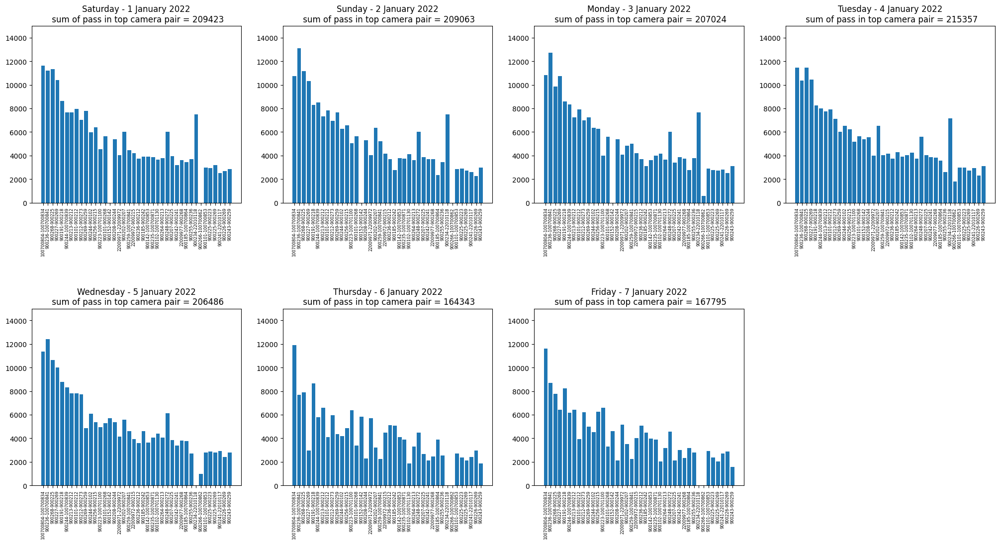

In [43]:
histogramPlot(0)

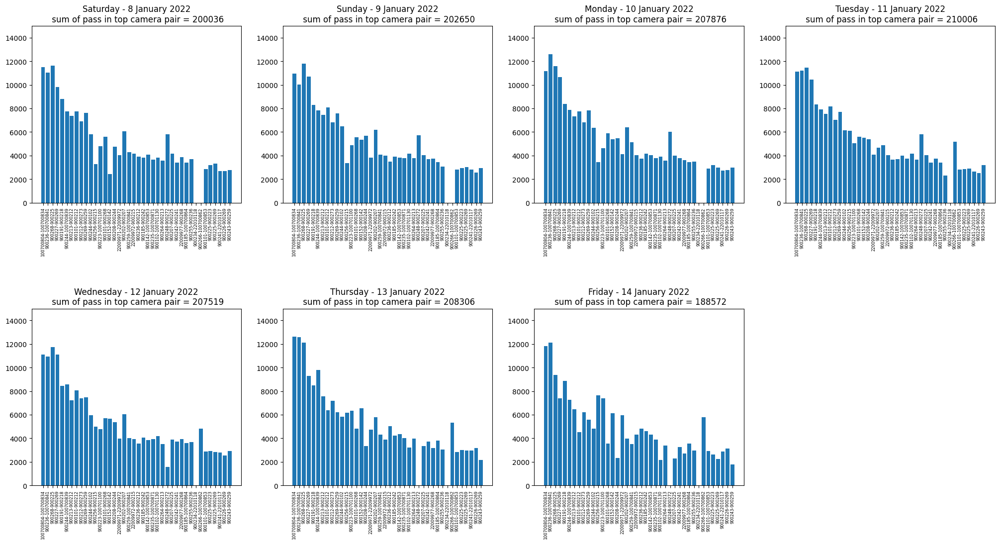

In [44]:
histogramPlot(7)

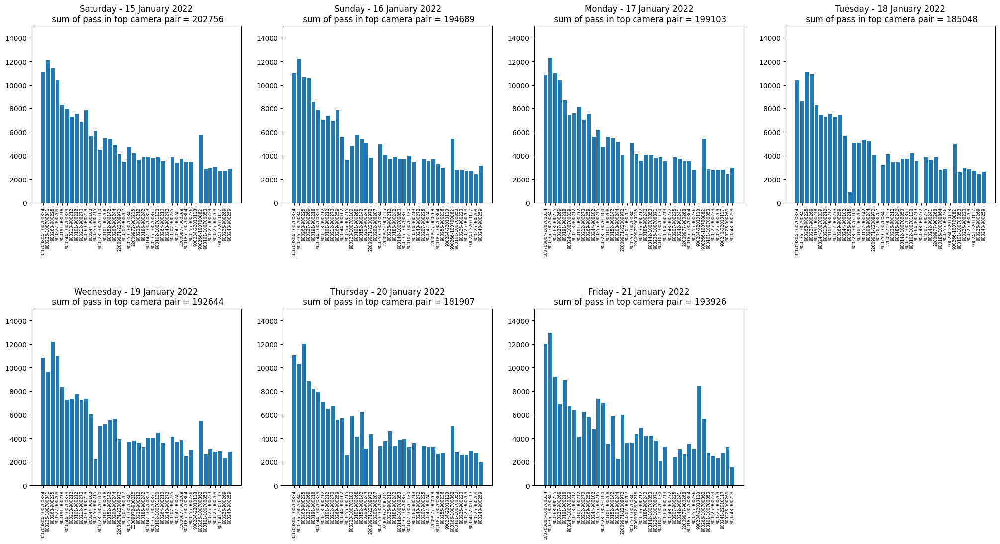

In [45]:
histogramPlot(7+7)

### ***Extra*** : Create a gif

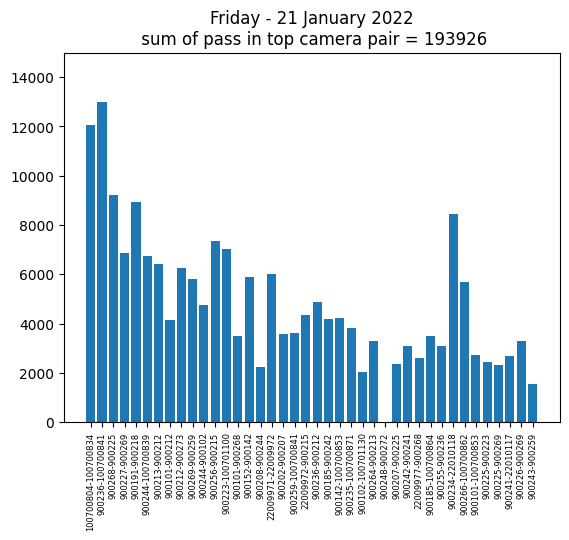

In [ ]:
from matplotlib.animation import FuncAnimation, PillowWriter
map_day=['Saturday','Sunday', 'Monday', 'Tuesday','Wednesday','Thursday','Friday']
fig,ax = plt.subplots()
plt.subplots_adjust( hspace=0.7)

def animate(day):
# for day in range(cycle):
    ax.clear()    
    pairs = [['-'.join((str(i[0]), str(i[1]))), 0] for i in freq_pair]
    for i in devicepair_traffic_perday_list[day][1]:
        if i[0] in freq_pair:
            pair = '-'.join((str(i[0][0]), str(i[0][1])))
            pass_pair = i[1]
            pairs[freq_pair.index(i[0])] = [pair, pass_pair]
    
    data = np.array(pairs)
    dsss = ax.bar(x=data[:,0],height=list(map(int, data[:,1])))
    plt.xticks(rotation=90, fontsize=6)
    plt.ylim((0,15000))
    plt.title(map_day[day%7] + f" - {1+day} January 2022" + "\n sum of pass in top camera pair = "+str(sum(list(map(int, data[:,1])))))
    return dsss

ani = FuncAnimation(fig, animate, interval=40, blit=True, repeat=True, frames=21)    
ani.save("pass_day_40pair.gif", dpi=300, writer=PillowWriter(fps=1))

## ***Extra*** : Plot Graph 

In [46]:
# traffic graph in all day of january
all_links = []
for day,pairs in devicepair_traffic_perday_list:
    l = [i[0] for i in pairs]
    all_links.extend(l)

In [47]:
# traffic graph in each day of january
day_links = []
for day,pairs in devicepair_traffic_perday_list:
    l = [i[0] for i in pairs]
    day_links.append(l)

In [48]:
len(all_links)

7423

Graph Density =  0.025711468019160327


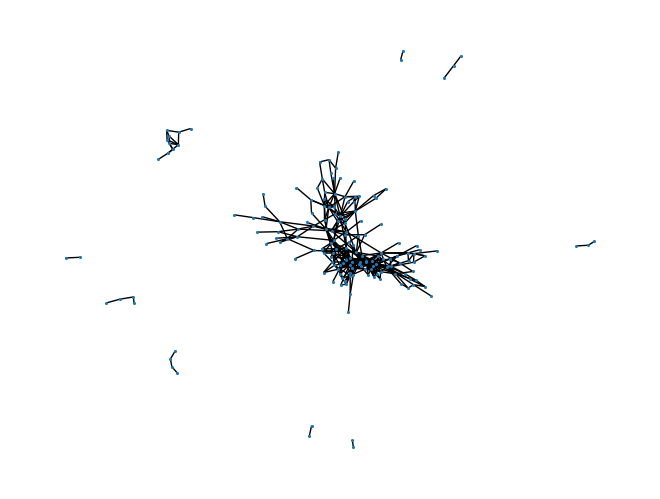

In [49]:
import networkx as nx
# plot traffic graph
G = nx.Graph()
G.add_edges_from(all_links)
print("Graph Density = ", nx.density(G))
nx.draw(G, with_labels=False, node_size = 1.5)
plt.savefig('pics/traffic_graph')
G.clear_edges()

Graph Density =  0.03617432374409618


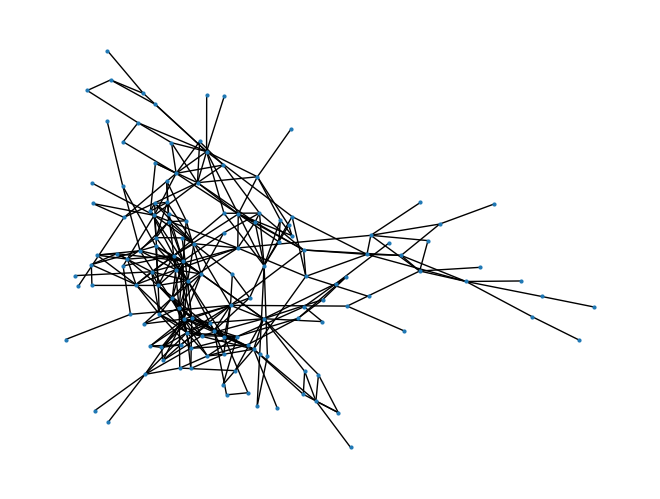

In [50]:
# largest connected graph in traffic Graph
G = nx.Graph()
G.add_edges_from(all_links)
innerTrafficGraph = max(nx.connected_components(G), key=len)
H = G.subgraph(innerTrafficGraph)
print("Graph Density = ", nx.density(H))
nx.draw(H, with_labels=False, node_size = 4)
plt.savefig(f'pics/inner_connected_traffic_graph', dpi=1000)

In [51]:
density = []
for i in range(21):
    G = nx.Graph()
    G.add_edges_from(day_links[i])
    innerTrafficGraph = max(nx.connected_components(G), key=len)
    H = G.subgraph(innerTrafficGraph)
    density.append((nx.density(H), i+1))

In [52]:
# density in each day of january
sorted(density, key=lambda x: x[0])

[(0.03143560770679415, 7),
 (0.03168287651046272, 6),
 (0.03198720511795282, 14),
 (0.03286978508217446, 20),
 (0.03300913645741232, 18),
 (0.03305322128851541, 21),
 (0.03333333333333333, 13),
 (0.03333333333333333, 16),
 (0.03375587523144851, 1),
 (0.03375587523144851, 17),
 (0.03389830508474576, 8),
 (0.034043169636389974, 4),
 (0.03415977961432507, 11),
 (0.0343328987396784, 3),
 (0.03471074380165289, 12),
 (0.03493253373313343, 2),
 (0.03493253373313343, 9),
 (0.03566165635131152, 5),
 (0.036281859070464766, 10),
 (0.03646071700991609, 15),
 (0.03720693170234455, 19)]

# 2 - Item-Basket Analysis

In [5]:
# reduce by key = (plate) and value=(device id)
# after that we have set of device id that represent each our basket ( plates is customer )
# .filter(lambda x: x['ORIGINE_CAR_KEY'] in top_car)
basket = data_rdd.map(lambda x: (x['ORIGINE_CAR_KEY'], x['DEVICE_CODE'])).groupByKey().mapValues(set)
basket.take(2)

[('52404132',
  {900202,
   900207,
   900222,
   900224,
   900225,
   900228,
   900269,
   900277,
   22010057,
   22010058}),
 ('34023810',
  {900101,
   900102,
   900142,
   900193,
   900212,
   900236,
   900244,
   900247,
   900258,
   900259,
   22010039,
   22010040,
   22010055,
   22010056,
   22010059,
   100700839,
   100701130})]

## Frequent Items

In [6]:
# find one frequent item with mean support thereshold. we create a dictionary with supprort of each freq items to calculate confidence and interest
support = basket.flatMap(lambda x: x[1]).map(lambda x: (x,1)).reduceByKey(lambda x,y: x+y).map(lambda x: x[1]).mean()
print('Support threshold : ', support)
freq_1_rdd = basket.flatMap(lambda x: x[1]).map(lambda x: (x,1)).reduceByKey(lambda x,y: x+y).filter(lambda x: x[1] > support )
frequentItems_dict = dict(freq_1_rdd.collect())
freq_1_list = list(frequentItems_dict.keys())

Support threshold :  132608.8686868687


In [7]:
def checkSubset(pair, freq_dict, iter):
    """ 
        Make sure the frequent items set contains the frequent subsets
        --------------------------------------------------------------
        `pair` : candidate frequent pairs
        `freq_dict` : a dictionary contains frequent items and their support
        `iter` : size of frequent pairs
    """
    for i in range(2,iter):
        for pair in itertools.combinations(list(set(pair)), i):
            if (set(pair) in freq_dict[i]) and len(pair):
                pass
            else:
                return False
    return True

def findCandidatePairs(items, freq_dict, size):
    """ 
        find candidate pair to use for frequent items
        -------------------------------------------------------------
        `items` : set of items (basket)
        `freq_dict` : a dictionary contains frequent items and their support
        `size` : size of frequent pairs
    """
    candidate_pair = []
    for pair in itertools.combinations(list(set(items)), size):
        if set(pair).issubset(freq_dict[1]) and len(set(pair)) == size:
            if checkSubset(pair, freq_dict, size):
                candidate_pair.append((frozenset(pair), 1))
                
    return candidate_pair

In [8]:
# find all frequent items. the iter is set the maximum size of frequent item subset
frequentItems={}
frequentItems[1] = freq_1_list
count_basket = basket.count()
iter = 3
for i in range(2, iter+1):
    support = support*0.5
    frequentItems_rdd = basket.map(lambda x : x[1]).flatMap(lambda x: findCandidatePairs(x, frequentItems, i)).reduceByKey(lambda x,y:x+y).filter(lambda x: x[1] > support)
    temp = dict(frequentItems_rdd.map(lambda x: (tuple(set(x[0])),x[1])).collect())
    frequentItems_dict.update(temp)
    frequentItems[i] = frequentItems_rdd.map(lambda x: set(x[0])).collect()

In [10]:
pd.DataFrame(list(frequentItems_dict.items()), columns=['Itemset','support'])

,Itemset,support
0,900258,138591
1,22010094,177126
2,900202,414654
3,900259,320400
4,22010095,147157
...,...,...
3305,"(100700841, 900268, 900246)",48459
3306,"(900227, 900268, 900246)",38444
3307,"(900268, 900236, 900164)",36140
3308,"(100700804, 900244, 900207)",36351


In [11]:
pd.DataFrame(list(frequentItems_dict.items()), columns=['Itemset','support']).head(len(frequentItems[1])).sort_values(by=['support'], ascending=False).reset_index(drop=True)

,Itemset,support
0,900244,1069156
1,900212,965951
2,100700853,809020
3,900269,766715
4,100700841,739869
...,...,...
92,900258,138591
93,100700894,136278
94,900272,135873
95,22010099,132998


In [12]:
pd.DataFrame(filter(lambda x: type(x[0]) != int and len(x[0]) == 2 ,list(frequentItems_dict.items())), columns=['Itemset','support']).sort_values(by=['support'], ascending=False).reset_index(drop=True)

,Itemset,support
0,"(900244, 900212)",702691
1,"(900212, 900142)",460588
2,"(900244, 900142)",390710
3,"(900212, 100700853)",389797
4,"(100700853, 900142)",367608
...,...,...
602,"(100700826, 900269)",66509
603,"(900217, 900277)",66364
604,"(900269, 900182)",66363
605,"(100700804, 900101)",66341


In [13]:
pd.DataFrame(filter(lambda x: type(x[0]) != int and len(x[0]) == 3 ,list(frequentItems_dict.items())), columns=['Itemset','support']).sort_values(by=['support'], ascending=False).reset_index(drop=True)

,Itemset,support
0,"(900244, 900212, 900142)",367126
1,"(900244, 900212, 100700853)",312314
2,"(900212, 100700853, 900142)",289025
3,"(900244, 100700853, 900142)",248117
4,"(900244, 900212, 900101)",239045
...,...,...
2601,"(100700881, 900202, 900164)",33250
2602,"(900193, 900225, 100700841)",33246
2603,"(900155, 900236, 100700839)",33242
2604,"(100700804, 900226, 900244)",33242


## Association Rule

In [20]:
# choose a random set of two to example an association rule
while True:
    x,y = random.choice(frequentItems[2])
    if x != y:
        query = (x,y)
        try:
            frequentItems_dict[query]
            break
        except:
            continue
support_query = frequentItems_dict[query]
association_rules = [] 
for item in frequentItems[3]:
    if set(query).issubset(item): 
        try:
            support_union = frequentItems_dict[tuple(item)]
        except:
            continue
        
        i,j = query
        item.remove(i)
        item.remove(j)

        confidence = (support_union)/(support_query)
        interest = confidence - frequentItems_dict[list(item)[0]]/count_basket
        
        lift = confidence/(frequentItems_dict[list(item)[0]]/count_basket)
        conviction = (1-(frequentItems_dict[list(item)[0]]/count_basket))/(1-confidence)
        
        association_rules.append((set(query), item,support_union, confidence, interest, lift, conviction))

In [21]:
pd.DataFrame(association_rules, columns=['antecedent','consequent','support','confidence','interest', 'lift', 'conviction']).sort_values(by=['support','confidence','interest'], ascending=False).reset_index(drop=True)

,antecedent,consequent,support,confidence,interest,lift,conviction
0,"{900101, 900207}",{900212},85496,0.740283,0.636812,7.154540,3.451946
1,"{900101, 900207}",{900244},78574,0.680347,0.565822,5.940579,2.770115
2,"{900101, 900207}",{900225},66309,0.574149,0.503338,8.108276,2.181958
3,"{900101, 900207}",{100700841},65916,0.570746,0.491493,7.201568,2.144992
4,"{900101, 900207}",{900268},62209,0.538648,0.490399,11.163975,2.062961
5,"{900101, 900207}",{900222},54503,0.471924,0.398193,6.400615,1.754045
6,"{900101, 900207}",{900142},54073,0.468201,0.398738,6.740285,1.749791
7,"{900101, 900207}",{900236},53685,0.464841,0.412332,8.852542,1.770486
8,"{900101, 900207}",{900202},50450,0.436831,0.392414,9.834818,1.696795
9,"{900101, 900207}",{900259},48730,0.421938,0.387617,12.294049,1.670546


In [28]:
query = 900142
support_query = frequentItems_dict[query]
association_rules = [] 
for item in frequentItems[2]:
    if query in item: 
        try:
            support_union = frequentItems_dict[tuple(item)]
        except:
            continue

        i= query
        item.remove(i)

        confidence = (support_union)/(support_query)
        interest = confidence - frequentItems_dict[list(item)[0]]/count_basket
        
        lift = confidence/(frequentItems_dict[list(item)[0]]/count_basket)
        conviction = (1-(frequentItems_dict[list(item)[0]]/count_basket))/(1-confidence)
        
        association_rules.append((query, item,support_union, confidence, interest, lift, conviction))

In [29]:
pd.DataFrame(association_rules, columns=['antecedent','consequent','support','confidence','interest', 'lift', 'conviction']).sort_values(by=['support','confidence','interest'], ascending=False).reset_index(drop=True).head(5)

,antecedent,consequent,support,confidence,interest,lift,conviction
0,900142,{900244},390710,0.602506,0.487980,5.260892,2.227642
1,900142,{100700853},367608,0.566881,0.480220,6.541414,2.108749
2,900142,{900101},185646,0.286281,0.225380,4.700778,1.315783
3,900142,{900269},173307,0.267253,0.185124,3.254079,1.252645
4,900142,{100700841},170043,0.262220,0.182967,3.308643,1.247996


# 3 - Collaborate Filtering 

In [53]:
# Find the number of passes that a car makes over a camera during each hour of the day
device_hour_rdd = data_rdd.map(lambda x: ((x['DEVICE_CODE'], datetime.strptime(x['PASS_DAY_TIME'].strftime("%Y-%m-%d-%H"),"%Y-%m-%d-%H")), 1))\
                            .reduceByKey(lambda x,y : x + y)\
                            .map(lambda x: ( x[0][0], ( x[0][1], x[1] ))).groupByKey().mapValues(list)
device_hour_rdd.take(1)

[(100701045,
  [(datetime.datetime(2021, 12, 24, 8, 0), 127),
   (datetime.datetime(2021, 12, 31, 16, 0), 841),
   (datetime.datetime(2021, 12, 31, 10, 0), 219),
   (datetime.datetime(2022, 1, 5, 11, 0), 532),
   (datetime.datetime(2022, 1, 6, 19, 0), 216),
   (datetime.datetime(2022, 1, 13, 1, 0), 27),
   (datetime.datetime(2022, 1, 19, 18, 0), 822),
   (datetime.datetime(2021, 12, 25, 14, 0), 637),
   (datetime.datetime(2021, 12, 28, 21, 0), 291),
   (datetime.datetime(2021, 12, 31, 0, 0), 91),
   (datetime.datetime(2021, 12, 31, 7, 0), 101),
   (datetime.datetime(2022, 1, 3, 17, 0), 632),
   (datetime.datetime(2022, 1, 6, 1, 0), 62),
   (datetime.datetime(2022, 1, 10, 9, 0), 365),
   (datetime.datetime(2022, 1, 11, 5, 0), 62),
   (datetime.datetime(2022, 1, 15, 3, 0), 12),
   (datetime.datetime(2022, 1, 15, 8, 0), 218),
   (datetime.datetime(2022, 1, 15, 15, 0), 556),
   (datetime.datetime(2022, 1, 17, 10, 0), 413),
   (datetime.datetime(2022, 1, 18, 8, 0), 212),
   (datetime.dateti

In [66]:
# create vector for each camera
def deviceVector(device_list, per_hour):
    pack = 24//per_hour
    vector = (28*pack)*[0]
    for time, traffic in device_list:
        vector[((time.day+7)%31)*pack + time.hour//per_hour] += traffic
    return vector

### Per 1 Hour 

In [67]:
device_hour_vector_rdd = device_hour_rdd.mapValues(lambda x: deviceVector(x,1))
device_hour_vector = device_hour_vector_rdd.collect()
device_hour_vector[0]

(100701045,
 [95,
  62,
  33,
  22,
  19,
  43,
  57,
  115,
  127,
  146,
  216,
  294,
  558,
  700,
  731,
  782,
  606,
  609,
  435,
  230,
  203,
  214,
  155,
  91,
  68,
  38,
  18,
  14,
  24,
  66,
  97,
  285,
  242,
  329,
  411,
  457,
  498,
  481,
  637,
  509,
  633,
  701,
  797,
  516,
  408,
  285,
  205,
  82,
  70,
  34,
  17,
  18,
  15,
  61,
  102,
  262,
  295,
  354,
  531,
  512,
  647,
  533,
  663,
  621,
  572,
  749,
  771,
  565,
  454,
  289,
  195,
  83,
  64,
  36,
  17,
  12,
  21,
  59,
  94,
  257,
  227,
  353,
  431,
  510,
  545,
  523,
  690,
  589,
  603,
  796,
  715,
  591,
  470,
  272,
  148,
  93,
  58,
  25,
  21,
  17,
  22,
  53,
  100,
  201,
  187,
  329,
  434,
  579,
  511,
  577,
  574,
  572,
  707,
  804,
  856,
  609,
  478,
  291,
  182,
  92,
  51,
  34,
  19,
  19,
  20,
  57,
  93,
  235,
  233,
  317,
  458,
  527,
  545,
  568,
  650,
  755,
  706,
  733,
  800,
  584,
  490,
  291,
  184,
  98,
  70,
  35,
  24,
  13,
  

In [68]:
device_matrix = np.array([device[1] for device in device_hour_vector])
device_matrix_unbiased = device_matrix - np.mean(device_matrix, axis=1).reshape(-1,1)
pearsoncor = np.corrcoef(device_matrix_unbiased)
pearsoncor

array([[1.        , 0.41143751, 0.73700302, ..., 0.11359744, 0.62876406,
        0.16078671],
       [0.41143751, 1.        , 0.39463818, ..., 0.17274056, 0.10365044,
        0.79399659],
       [0.73700302, 0.39463818, 1.        , ..., 0.08578537, 0.70133042,
        0.21145291],
       ...,
       [0.11359744, 0.17274056, 0.08578537, ..., 1.        , 0.10471384,
        0.20461129],
       [0.62876406, 0.10365044, 0.70133042, ..., 0.10471384, 1.        ,
        0.10056297],
       [0.16078671, 0.79399659, 0.21145291, ..., 0.20461129, 0.10056297,
        1.        ]])

In [69]:
mylist = []
for i in range(pearsoncor.shape[0]):
    for j in range(i+1, pearsoncor.shape[0]):
        mylist.append((device_hour_vector[i][0], device_hour_vector[j][0], pearsoncor[i][j]))

In [70]:
pd.DataFrame(filter(lambda x: x[2] >=0 ,sorted(mylist, key=lambda x: x[2])[::-1]), columns=['Device A', 'Device B', 'Correlation'])

,Device A,Device B,Correlation
0,100700832,900184,0.987327
1,100700884,100700885,0.983218
2,900266,900235,0.979531
3,900207,900225,0.977729
4,900264,900213,0.976499
...,...,...,...
41244,22010113,22010060,0.000101
41245,100700963,100700924,0.000091
41246,100700957,22010136,0.000085
41247,900102,22010092,0.000072


In [71]:
pd.DataFrame(filter(lambda x: x[2] <=0 ,sorted(mylist, key=lambda x: x[2])), columns=['Device A', 'Device B', 'Correlation'])

,Device A,Device B,Correlation
0,900265,900184,-0.462785
1,900265,100700832,-0.446894
2,100701222,900214,-0.425849
3,100701222,900265,-0.422736
4,22010100,22010138,-0.354389
...,...,...,...
2702,900123,100700921,-0.000150
2703,22010116,100700920,-0.000081
2704,100700948,900193,-0.000063
2705,22010094,100701149,-0.000036


### Per 6 Hour 

In [72]:
device_6_hour_vector_rdd = device_hour_rdd.mapValues(lambda x: deviceVector(x,6))
device_6_hour_vector = device_6_hour_vector_rdd.collect()
device_6_hour_vector[0]

(100701045,
 [274,
  955,
  3986,
  1328,
  228,
  1821,
  3459,
  2293,
  215,
  2056,
  3785,
  2357,
  209,
  1872,
  3746,
  2289,
  196,
  1830,
  3745,
  2508,
  200,
  1863,
  3957,
  2447,
  212,
  1551,
  4169,
  1584,
  266,
  916,
  4420,
  1199,
  244,
  1891,
  3390,
  2221,
  173,
  1921,
  3670,
  2231,
  214,
  1972,
  3511,
  2279,
  224,
  1805,
  3548,
  2379,
  204,
  1978,
  3875,
  2452,
  329,
  916,
  1595,
  1011,
  301,
  945,
  3773,
  1218,
  262,
  1918,
  3395,
  2279,
  193,
  1937,
  3633,
  2418,
  186,
  1929,
  3679,
  2409,
  217,
  1794,
  3596,
  2481,
  216,
  2082,
  3774,
  2662,
  188,
  1539,
  4198,
  1736,
  286,
  924,
  3845,
  1256,
  224,
  1808,
  3401,
  2332,
  225,
  1735,
  3699,
  2464,
  180,
  1750,
  3440,
  2297,
  194,
  1772,
  3513,
  2422,
  191,
  1734,
  3652,
  2466,
  217,
  1429,
  4381,
  1736])

In [73]:
device_matrix1 = np.array([device[1] for device in device_6_hour_vector])
device_matrix1_unbiased = device_matrix1 - np.mean(device_matrix1, axis=1).reshape(-1,1)
pearsoncor1 = np.corrcoef(device_matrix1_unbiased)
pearsoncor1

array([[1.        , 0.45472178, 0.85979494, ..., 0.13046318, 0.61845633,
        0.13374962],
       [0.45472178, 1.        , 0.39879918, ..., 0.25969376, 0.0696418 ,
        0.78865783],
       [0.85979494, 0.39879918, 1.        , ..., 0.20126607, 0.73310861,
        0.17868707],
       ...,
       [0.13046318, 0.25969376, 0.20126607, ..., 1.        , 0.16014158,
        0.30464591],
       [0.61845633, 0.0696418 , 0.73310861, ..., 0.16014158, 1.        ,
        0.06338733],
       [0.13374962, 0.78865783, 0.17868707, ..., 0.30464591, 0.06338733,
        1.        ]])

In [74]:
mylist1 = []
for i in range(pearsoncor1.shape[0]):
    for j in range(i+1, pearsoncor1.shape[0]):
        mylist1.append((device_6_hour_vector[i][0], device_6_hour_vector[j][0], pearsoncor1[i][j]))

In [75]:
pd.DataFrame(filter(lambda x: x[2] >=0 ,sorted(mylist1, key=lambda x: x[2])[::-1]), columns=['Device A', 'Device B', 'Correlation'])

,Device A,Device B,Correlation
0,100700864,100700871,0.995548
1,100700832,900184,0.994389
2,100700884,100700885,0.993839
3,900264,900213,0.993414
4,900150,22009977,0.993159
...,...,...,...
41246,22010127,100700862,0.000133
41247,100701162,100700899,0.000129
41248,100701135,22010134,0.000122
41249,900174,900123,0.000114


In [76]:
pd.DataFrame(filter(lambda x: x[2] <=0 ,sorted(mylist1, key=lambda x: x[2])), columns=['Device A', 'Device B', 'Correlation'])

,Device A,Device B,Correlation
0,100701222,900265,-0.569346
1,100701222,900214,-0.567178
2,900265,900184,-0.544956
3,900265,100700832,-0.532219
4,100700963,900177,-0.500373
...,...,...,...
2700,100700826,22010060,-0.000293
2701,100701160,22010061,-0.000268
2702,22010125,900125,-0.000193
2703,100701293,100700960,-0.000081


### Comparison two method

In [77]:
differnce_mat = (np.nan_to_num(pearsoncor) - np.nan_to_num(pearsoncor1)).reshape(-1,1)
frobenius_norm = np.linalg.norm(differnce_mat, ord=1) 
print("average absolute deviation (AAD) :", frobenius_norm/pearsoncor.shape[0]**2)

average absolute deviation (AAD) : 0.07960073412843875


# 4 - Pixie:

In [78]:
# create a list of tuple with key=(device, car) , value= number pass top_car over each device
device_topcar_rdd = data_rdd.filter(lambda x: x['ORIGINE_CAR_KEY'] in top_car).map(lambda x: ((x['DEVICE_CODE'], x['ORIGINE_CAR_KEY']),1)).reduceByKey(lambda x,y:x+y)

In [79]:
# make a dictionary for device as pin and cars as board
devicePin_carBoard = dict(device_topcar_rdd.map(lambda x: (x[0][0],(x[0][1],x[1]))).groupByKey().mapValues(dict).collect())
carPin_deviceBoard = dict(device_topcar_rdd.map(lambda x: (x[0][1],(x[0][0],x[1]))).groupByKey().mapValues(dict).collect())

In [80]:
# merge two dictionary and create Traffic graph network 
edgesGraph_traffic = {**devicePin_carBoard,**carPin_deviceBoard}

In [81]:
def randomWalk(currPin, edgesGraph: dict, visitPins, alpha: float):
    """ 
        random walk
        -------------------------------
        `currPin` : current pin
        `edgesGraph` : graph network dictionary
        `visitPins` : pin visit count dictionary
        `alpha` : pressure parameter (length of walk)
    """
    currBoards_list = list(edgesGraph[currPin].keys())
    currBoards_weight = list(edgesGraph[currPin].values())
    currBoard = random.choices(currBoards_list, weights=currBoards_weight)[0]

    currPins_list = list(edgesGraph[currBoard].keys())
    currPins_weight = list(edgesGraph[currBoard].values())
    currPin = random.choices(currPins_list, weights=currPins_weight)[0]

    # if currPin not in visitPins:
    #     visitPins[currPin] = 1
    # else:
    #     visitPins[currPin] += 1
    try:
        visitPins[currPin] += 1
    except:
        visitPins[currPin] = 1
    
    return visitPins

def pixieAlgorithm(query, edgesGraph: dict, alpha: float, N_Step: int, pinList: list=None):
    """
        pixie algorithm
        -------------------------------
        `query`: query point
        `edgesGraph` : graph network dictionary
        `alpha` : pressure parameter
        `N_Step` : total number of steps of the walk
        `pinList` : list of pins
    """
    if pinList == None:
        V = {}
    else:
        V = dict.fromkeys(pinList, 0)

    initPin = query
    e_margin = 0.001
    for i in range(N_Step):
        V = randomWalk(initPin, edgesGraph, V, alpha)
        if np.random.random() < alpha + e_margin:
            initPin = query
    
    similarPins = sorted([(pin, visit/N_Step) for pin,visit in V.items()], key=lambda x: x[1])[::-1]
    return similarPins


In [82]:
# function to send random query and find similar and dissimilar to query
def sendRandomQuery(graph, pinList, alpha=0.5, N_Step=10000, query=None):
    if query == None:
        query = random.choice(pinList)
    
    simPins = pixieAlgorithm(query, graph, alpha=alpha, N_Step=N_Step, pinList=pinList)
    print(f"5 pins that are similar to the ({query}) :\n", simPins[:5])
    print('----------------------------------------------------------------------------')
    print(f'5 pins that are not related to the ({query}) :\n', simPins[-5:])
    return simPins

In [83]:
mypins = sendRandomQuery(edgesGraph_traffic, list(carPin_deviceBoard.keys()), query='14671049')

5 pins that are similar to the (14671049) :
 [('7682972', 0.0527), ('15147933', 0.0412), ('8552081', 0.0381), ('7971679', 0.0375), ('13259129', 0.0363)]
----------------------------------------------------------------------------
5 pins that are not related to the (14671049) :
 [('11286135', 0.0), ('78344129', 0.0), ('8987483', 0.0), ('15822964', 0.0), ('8728177', 0.0)]


In [84]:
sendRandomQuery(edgesGraph_traffic, list(carPin_deviceBoard.keys()));

5 pins that are similar to the (9227359) :
 [('23660341', 0.0099), ('11054045', 0.0093), ('32658470', 0.0091), ('21118149', 0.0087), ('13064328', 0.0082)]
----------------------------------------------------------------------------
5 pins that are not related to the (9227359) :
 [('28001027', 0.0), ('11005855', 0.0), ('33601713', 0.0), ('21345412', 0.0), ('17738065', 0.0)]


In [85]:
mypins = sendRandomQuery(edgesGraph_traffic, list(carPin_deviceBoard.keys()), query=900151)

5 pins that are similar to the (900151) :
 [(900151, 0.4544), (100700864, 0.2912), (900148, 0.0944), (100700838, 0.0606), (900185, 0.0119)]
----------------------------------------------------------------------------
5 pins that are not related to the (900151) :
 [('12405124', 0.0), ('8987483', 0.0), ('15822964', 0.0), ('13363735', 0.0), ('8728177', 0.0)]


In [86]:
sendRandomQuery(edgesGraph_traffic, list(devicePin_carBoard.keys()));

5 pins that are similar to the (900224) :
 [(900224, 0.6454), (900155, 0.0771), (900227, 0.0385), (900222, 0.0255), (900178, 0.0238)]
----------------------------------------------------------------------------
5 pins that are not related to the (900224) :
 [(100700818, 0.0), (900145, 0.0), (100700932, 0.0), (22010095, 0.0), (22010094, 0.0)]


## **Extra** Plot Bipartite Graph

In [87]:
pin_node = list(map(lambda x: x[0] , filter(lambda x: x[1] != 0 ,mypins)))[:10]
board_node = sorted(carPin_deviceBoard, key=lambda x: len(carPin_deviceBoard[x]), reverse=True)[:10]
binodes  = device_topcar_rdd.map(lambda x: (x[0][1],x[0][0])).filter(lambda x: (x[1] in pin_node) and (x[0] in board_node) ).collect()

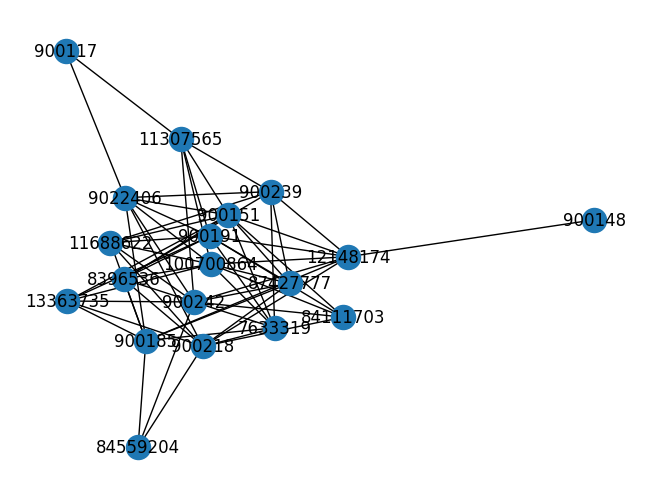

In [88]:
from networkx.algorithms import bipartite
import networkx as nx

B = nx.Graph()
B.add_nodes_from(pin_node, bipartite=0)
B.add_nodes_from(board_node, bipartite=1)
B.add_edges_from(binodes)
B = B.subgraph(max(nx.connected_components(B), key=len))
nx.draw(B, with_labels = True)  


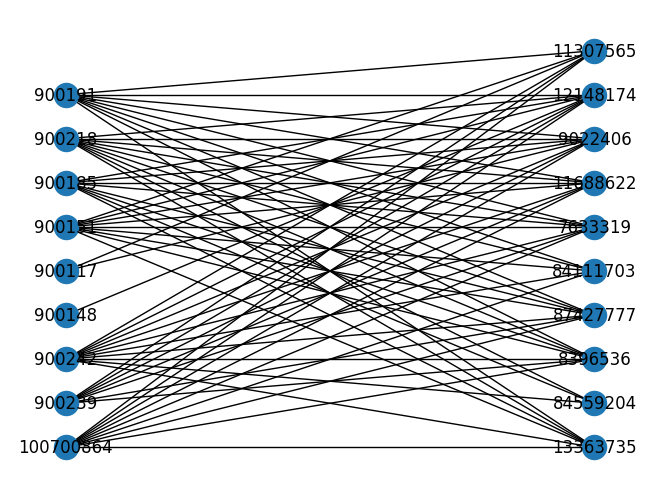

In [89]:
X,Y = bipartite.sets(B)
pos = dict()
pos.update( (n, (1, i)) for i, n in enumerate(X) ) 
pos.update( (n, (2, i)) for i, n in enumerate(Y) )
nx.draw(B, with_labels = True, pos=pos)
plt.show()

## Time Analysis

In [90]:
device_topcar_rdd_time = data_rdd.filter(lambda x: x['ORIGINE_CAR_KEY'] in top_car)\
                          .map(lambda x: ((x['DEVICE_CODE'], x['ORIGINE_CAR_KEY'], x['PASS_DAY_TIME'].hour), 1 )).reduceByKey(lambda x,y:x+y)

In [91]:
# make a dictionary for device as pin and cars as board
devicePin_carTimeBoard = dict(device_topcar_rdd_time.map(lambda x: (x[0][0],((x[0][1], x[0][2]),x[1]))).groupByKey().mapValues(dict).collect())
carTimePin_deviceBoard = dict(device_topcar_rdd_time.map(lambda x: ((x[0][1], x[0][2]),(x[0][0],x[1]))).groupByKey().mapValues(dict).collect())

In [92]:
# make a dictionary for device as pin and cars as board
deviceTimePin_carBoard = dict(device_topcar_rdd_time.map(lambda x: ((x[0][0], x[0][2]), (x[0][1], x[1]))).groupByKey().mapValues(dict).collect())
carPin_deviceTimeBoard = dict(device_topcar_rdd_time.map(lambda x: (x[0][1], ((x[0][0], x[0][2]), x[1]))).groupByKey().mapValues(dict).collect())

In [93]:
edgesGraph_traffic_cartime = {**devicePin_carTimeBoard,**carTimePin_deviceBoard}

In [94]:
edgesGraph_traffic_devicetime = {**deviceTimePin_carBoard,**carPin_deviceTimeBoard}

* time with car

In [95]:
sendRandomQuery(edgesGraph_traffic_cartime, list(devicePin_carTimeBoard.keys()));

5 pins that are similar to the (900247) :
 [(900247, 0.5012), (100701260, 0.0609), (900268, 0.0561), (900104, 0.0309), (900258, 0.0292)]
----------------------------------------------------------------------------
5 pins that are not related to the (900247) :
 [(100700818, 0.0), (100701160, 0.0), (900145, 0.0), (22010094, 0.0), (900144, 0.0)]


In [96]:
sendRandomQuery(edgesGraph_traffic_cartime, list(carTimePin_deviceBoard.keys()));

5 pins that are similar to the (('17832767', 5)) :
 [(('17832767', 7), 0.0371), (('9365605', 6), 0.0368), (('9365605', 7), 0.0363), (('21345412', 18), 0.0328), (('17832767', 6), 0.0313)]
----------------------------------------------------------------------------
5 pins that are not related to the (('17832767', 5)) :
 [(('36272262', 23), 0.0), (('8037407', 23), 0.0), (('41265712', 16), 0.0), (('17037534', 16), 0.0), (('59011918', 11), 0.0)]


* time with device

In [97]:
sendRandomQuery(edgesGraph_traffic_devicetime, list(deviceTimePin_carBoard.keys()));

5 pins that are similar to the ((100701100, 15)) :
 [((100701100, 15), 0.0138), ((900223, 14), 0.0126), ((100701100, 14), 0.012), ((900223, 15), 0.0116), ((100701100, 9), 0.0098)]
----------------------------------------------------------------------------
5 pins that are not related to the ((100701100, 15)) :
 [((900256, 9), 0.0), ((900226, 8), 0.0), ((900264, 10), 0.0), ((100700902, 16), 0.0), ((100701045, 12), 0.0)]


In [98]:
sendRandomQuery(edgesGraph_traffic_devicetime, list(carPin_deviceTimeBoard.keys()));

5 pins that are similar to the (14461366) :
 [('32776949', 0.0176), ('14461366', 0.0147), ('72446951', 0.0133), ('32945358', 0.0132), ('27891848', 0.012)]
----------------------------------------------------------------------------
5 pins that are not related to the (14461366) :
 [('7911949', 0.0), ('62072076', 0.0), ('8958175', 0.0), ('21345412', 0.0), ('17738065', 0.0)]


# 5 - HITS:

In [99]:
# create a RDD with key=deviceCode and values=car_key
device_car_rdd = data_rdd.filter(lambda x: x['ORIGINE_CAR_KEY'] in top_car).map(lambda x: ((x['DEVICE_CODE'],x['ORIGINE_CAR_KEY'])))

In [100]:
# make a dictionary with device keys and list of cars that device detected them values  
device_carlist = device_car_rdd.groupByKey().mapValues(list).collect()
device_carlist_auth = dict(device_carlist)
device_carlist_auth

{900258: ['15825134',
  '46384365',
  '90749906',
  '68410795',
  '13262211',
  '87427777',
  '82675563',
  '82675563',
  '25836581',
  '13311024',
  '8958175',
  '20631551',
  '9115710',
  '12397927',
  '9346038',
  '7736109',
  '7677846',
  '7677846',
  '7677846',
  '7677846',
  '7999321',
  '9219523',
  '7736109',
  '7736109',
  '30057387',
  '12002080',
  '12002080',
  '88853919',
  '13262211',
  '103941438',
  '7632644',
  '7689934',
  '7736109',
  '8958175',
  '9336737',
  '9336737',
  '7736109',
  '7857823',
  '8706015',
  '8821670',
  '7999321',
  '8588265',
  '73402904',
  '28636585',
  '75002880',
  '10635239',
  '12002080',
  '10586566',
  '9346038',
  '103941438',
  '78816177',
  '24426867',
  '30057387',
  '8821670',
  '8736324',
  '15213707',
  '12002080',
  '10354969',
  '8634358',
  '8706015',
  '7724755',
  '7677846',
  '7677846',
  '7690465',
  '74836453',
  '7656312',
  '9336737',
  '9456226',
  '12349916',
  '12002080',
  '84559204',
  '90749906',
  '90749906',
  '1

In [101]:
# make a dictionary with car keys and a list of device that they passed over device values  
car_devicelist = device_car_rdd.map(lambda x: (x[1],x[0])).groupByKey().mapValues(list).collect()
car_devicelist_hub = dict(car_devicelist)
car_devicelist_hub

{'13363735': [22010057,
  900236,
  900246,
  900218,
  900234,
  900149,
  100700881,
  900255,
  100701059,
  100700910,
  900170,
  900104,
  100700862,
  900234,
  100700847,
  900234,
  900221,
  900234,
  100700862,
  900202,
  900207,
  900266,
  100700862,
  900138,
  900256,
  900234,
  900277,
  900269,
  100700804,
  900215,
  100700834,
  900135,
  100700839,
  900268,
  100700820,
  22010096,
  22010088,
  900170,
  900233,
  900164,
  100700857,
  22010117,
  900215,
  900234,
  100700862,
  900135,
  900256,
  100700862,
  900135,
  900221,
  100700862,
  900234,
  900194,
  900228,
  900269,
  900135,
  900235,
  900269,
  100700862,
  100700804,
  900191,
  900234,
  900234,
  900233,
  900226,
  900256,
  900269,
  100700901,
  900246,
  900266,
  100700862,
  900205,
  900164,
  900235,
  900216,
  900236,
  900246,
  900268,
  900103,
  900164,
  900218,
  100700914,
  900164,
  900269,
  900233,
  900235,
  100700862,
  900135,
  900135,
  900233,
  100700862,
  90

In [102]:
def normalize(x,y):
    """
        normalizing weights 
    """
    norm = y**0.5
    new_dict = { device:weight/norm for device,weight in x.items() }
    return new_dict

def auth_update(auth, auth_weight, hub_weight):
    """
        update authority weights
        -------------------------
        `auth` : authority to hub dictionary
        `auth_weight` : authority nodes weights 
        `hub_weight` : hub nodes weights 
    """
    temp = 0
    for device,car_list in auth.items():
        weight = 0
        for car in car_list:
            weight += hub_weight[car]
        auth_weight[device] = weight
        temp += weight**2
    
    new_auth_dict = normalize(auth_weight, temp)
    return new_auth_dict

def hub_update(hub, auth_weight, hub_weight):
    """
        update hubs weights
        -------------------------
        `hub` : hub to authority dictionary
        `auth_weight` : authority nodes weights 
        `hub_weight` : hub nodes weights 
    """
    temp = 0
    for car,device_list in hub.items():
        weight = 0
        for device in device_list:
            weight += auth_weight[device]
        hub_weight[car] = weight
        temp += weight**2

    new_hub_dict = normalize(hub_weight, temp)
    return new_hub_dict


def hitsAlgorithm(authorities : dict, hubs: dict, iter):
    """
        HITS algorithm 
        --------------------
        in this algorithm, we use a standard pseudocode to implement it
        `authorities` : authority to hub dictionary
        `hubs` : hub to authority dictionary
        `iter` : number of updates 
    """
    device_auth = { device:1 for device in authorities.keys() } 
    car_hub = { car:1 for car in hubs.keys() }
    for i in range(iter):
        device_auth = auth_update(authorities, device_auth, car_hub)
        car_hub = hub_update(hubs, device_auth, car_hub)
        
    return device_auth, car_hub


In [103]:
# apply hits algorithm and get authority and hubs with their weights in 100 iteration
device_auth, car_hub = hitsAlgorithm(device_carlist_auth, car_devicelist_hub, 100)

In [104]:
# sort authority and hubs list by weights
authority = sorted(list(device_auth.items()), key=lambda x: x[1])[::-1]
hub = sorted(list(car_hub.items()), key=lambda x: x[1])[::-1]

In [105]:
authority[:10]

[(900151, 0.755489868193996),
 (100700864, 0.59709582243024),
 (900148, 0.1506567128625825),
 (900185, 0.08786966049300586),
 (100700838, 0.08688736726917536),
 (100700853, 0.0850714126955149),
 (900269, 0.07051193650875391),
 (900225, 0.06096235617222238),
 (900268, 0.05752502599085646),
 (900212, 0.048837778183306035)]

In [106]:
hub[:10]

[('7682972', 0.3336559861105859),
 ('15147933', 0.253308428784951),
 ('8552081', 0.2504212035589193),
 ('7971679', 0.23794625732088978),
 ('9590687', 0.23443531820902333),
 ('24073436', 0.22785733335265368),
 ('13259129', 0.22061029413201175),
 ('14671049', 0.21733064282807846),
 ('23123695', 0.20696846665947272),
 ('8742477', 0.19652385252676133)]

## **Extra** Plot Bipartite Graph

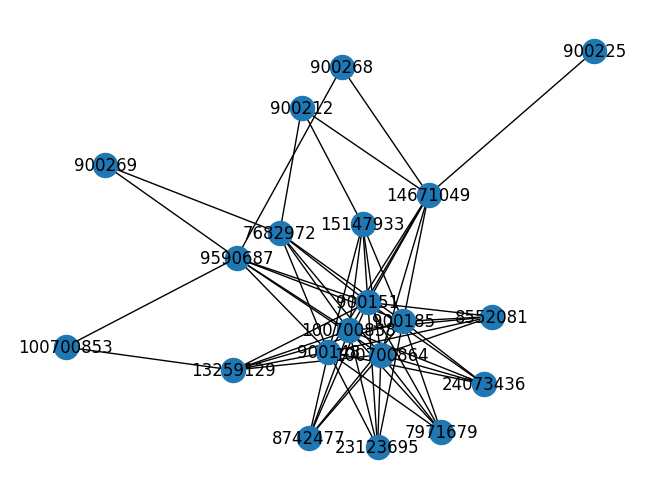

In [107]:
from networkx.algorithms import bipartite

hub_node = list(map(lambda x: x[0],hub[:10]))
auth_node = list(map(lambda x: x[0],authority[:10]))
binodes  = device_car_rdd.map(lambda x: (x[1],x[0])).filter(lambda x: (x[0] in hub_node) and (x[1] in auth_node) ).collect()
B = nx.Graph()
B.add_nodes_from(hub_node, bipartite=0)
B.add_nodes_from(auth_node, bipartite=1)
B.add_edges_from(binodes)
B = B.subgraph(max(nx.connected_components(B), key=len))
nx.draw(B, with_labels = True)  

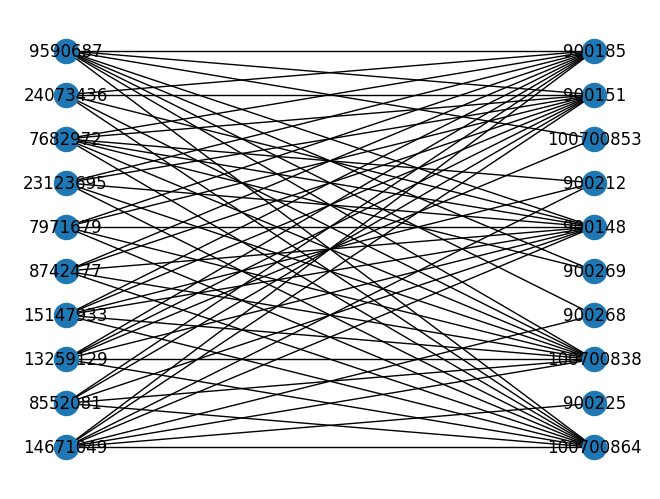

In [108]:
X,Y = bipartite.sets(B)
pos = dict()
pos.update( (n, (1, i)) for i, n in enumerate(X) ) 
pos.update( (n, (2, i)) for i, n in enumerate(Y) )
nx.draw(B, with_labels = True, pos=pos)
plt.show()

## Time Analysis

In [109]:
device_car_time_rdd = data_rdd.filter(lambda x: x['ORIGINE_CAR_KEY'] in top_car)\
                          .map(lambda x: (x['DEVICE_CODE'], x['ORIGINE_CAR_KEY'], x['PASS_DAY_TIME'].hour ))

In [110]:
# make a dictionary with device and time  keys and list of cars that device detected them values  
device_carlist_time  = device_car_time_rdd.map(lambda x: (( x[0], x[2]), x[1] )).groupByKey().mapValues(list).collect()
device_carlist_time_auth = dict(device_carlist_time)

# make a dictionary with car keys and a list of device that they passed over device with times values  
car_devicelist_time = device_car_time_rdd.map(lambda x: (x[1], (x[0], x[2]))).groupByKey().mapValues(list).collect()
car_devicelist_time_hub = dict(car_devicelist_time)

In [111]:
# apply hits algorithm and get authority and hubs with their weights in 100 iteration
device_auth_time, car_hub_time = hitsAlgorithm(device_carlist_time_auth, car_devicelist_time_hub, 100)

In [112]:
# sort authority and hubs list by weights
authority_time = sorted(list(device_auth_time.items()), key=lambda x: x[1])[::-1]
hub_time = sorted(list(car_hub_time.items()), key=lambda x: x[1])[::-1]

In [113]:
authority_time[:10]

[((900151, 18), 0.3590188724141352),
 ((900151, 17), 0.30285600569823284),
 ((900151, 16), 0.26475939593238645),
 ((900151, 19), 0.2607935566692428),
 ((900151, 15), 0.25572164729325214),
 ((100700864, 16), 0.2381230311867904),
 ((100700864, 15), 0.23274861228594043),
 ((900151, 20), 0.18952898874613155),
 ((900151, 14), 0.18161245751665014),
 ((100700864, 17), 0.17646653610037383)]

In [114]:
hub_time[:10]

[('7682972', 0.32911877380334886),
 ('8552081', 0.25429128130785983),
 ('24073436', 0.251626857491662),
 ('13259129', 0.24291671165311435),
 ('9590687', 0.2325126547801628),
 ('15147933', 0.227621643460336),
 ('23123695', 0.22494850625892493),
 ('7971679', 0.221980150346103),
 ('8742477', 0.203828468660702),
 ('14671049', 0.20262609136666368)]

# 6 - SVD

In [115]:
# create a list of tuple with key=(device, car) , value= number pass top_car over each device
device_topcar_list = data_rdd.filter(lambda x: x['ORIGINE_CAR_KEY'] in top_car).map(lambda x: ((x['DEVICE_CODE'], x['ORIGINE_CAR_KEY']),1))\
                                .reduceByKey(lambda x,y:x+y).collect()
device_topcar_list[:20]

[((100700853, '21118149'), 99),
 ((900231, '85701921'), 8),
 ((900218, '10609343'), 125),
 ((900233, '13290005'), 298),
 ((900243, '10263782'), 159),
 ((100700929, '23094779'), 5),
 ((900264, '23094779'), 596),
 ((900212, '23702925'), 123),
 ((900266, '16038437'), 29),
 ((22010059, '7633319'), 1),
 ((900232, '7653894'), 16),
 ((900135, '7798481'), 22),
 ((900222, '8622784'), 47),
 ((22009977, '8622784'), 106),
 ((900273, '7902953'), 6),
 ((100700902, '8964685'), 15),
 ((900174, '8964685'), 142),
 ((22009977, '42451788'), 170),
 ((900273, '14324009'), 208),
 ((100700864, '17177358'), 38)]

In [116]:
device_list = data_rdd.map(lambda x:x['DEVICE_CODE']).distinct().collect()
print("number of distinct device : ", len(device_list))

number of distinct device :  297


In [117]:
# create utility matrix
utility_matrix = np.zeros((len(top_car), len(device_list)))
for (device,car), i in device_topcar_list:
    top_car_index = top_car.index(car)
    device_index = device_list.index(device)
    utility_matrix[top_car_index][device_index] = i
utility_matrix

array([[ 7.,  3.,  0., ...,  4.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0., 32., ...,  0.,  0.,  9.],
       ...,
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [118]:
sparsity = 1 - np.count_nonzero(utility_matrix)/utility_matrix.size
print("Sparsity of Utility Matrix : ", sparsity)

Sparsity of Utility Matrix :  0.8753162891439444


In [119]:
# Singular value decomposition
from pyspark.mllib.linalg.distributed import RowMatrix
utility_matrix_rdd = sc.parallelize(utility_matrix)
mat = RowMatrix(utility_matrix_rdd)
svd = mat.computeSVD(len(device_list), computeU=True)
u = np.array(svd.U.rows.collect())
sigma = svd.s.toArray()
v_t = svd.V.toArray().T

# calculate reconstruct error of approximate utility matrix with svd 
error_approximate = []
for step in range(1,len(device_list)):
    approximate_utility = u[:,:step]@np.diag(sigma[:step])@v_t[:step,:]
    error = np.linalg.norm(approximate_utility - utility_matrix, ord='fro')/np.linalg.norm(utility_matrix)
    error_approximate.append(error)

23/02/10 00:10:12 WARN InstanceBuilder$NativeBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.JNIBLAS
23/02/10 00:10:12 WARN InstanceBuilder$NativeBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.ForeignLinkerBLAS
23/02/10 00:10:12 WARN LAPACK: Failed to load implementation from: com.github.fommil.netlib.NativeSystemLAPACK
23/02/10 00:10:12 WARN LAPACK: Failed to load implementation from: com.github.fommil.netlib.NativeRefLAPACK


In [120]:
sigma[:5]

array([2922.6124634 , 2843.8227585 , 2450.43106352, 2251.73226667,
       2230.48508014])

In [121]:
min_number_approximate = min(np.where(np.array(error_approximate) < 0.1)[0])
print('min number of singular values to reconstruct 90% of utility matrix : ', min_number_approximate)

min number of singular values to reconstruct 90% of utility matrix :  88


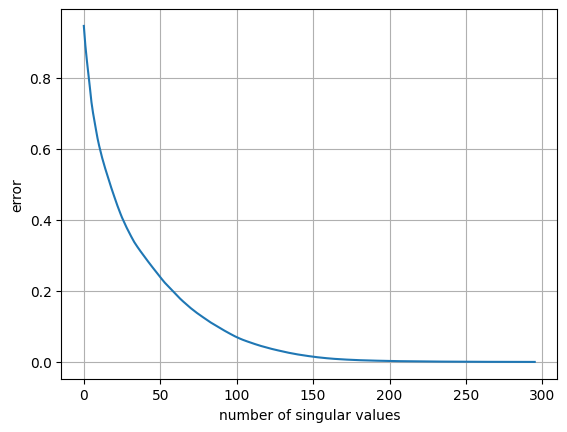

In [122]:
plt.plot(error_approximate)
plt.xlabel('number of singular values')
plt.ylabel('error');
plt.grid()

# **Extra** K-Means Clustring

In [183]:
from pyspark.mllib.clustering import KMeans, KMeansModel
utility_matrix_rdd = sc.parallelize(utility_matrix)
model_kmeans = KMeans.train(utility_matrix_rdd,
                            k=2,
                            maxIterations=100)

In [184]:
x1 = []
y1 = []
x2 = []
y2 = []

for i in range(998):
    if model_kmeans.predict(utility_matrix[i][:]) == 0:
        x1.append(utility_matrix[i][:].reshape(1,297)@v_t.T[:,0])
        y1.append(utility_matrix[i][:].reshape(1,297)@v_t.T[:,1])
    if model_kmeans.predict(utility_matrix[i][:]) == 1:
        x2.append(utility_matrix[i][:].reshape(1,297)@v_t.T[:,0])
        y2.append(utility_matrix[i][:].reshape(1,297)@v_t.T[:,1])

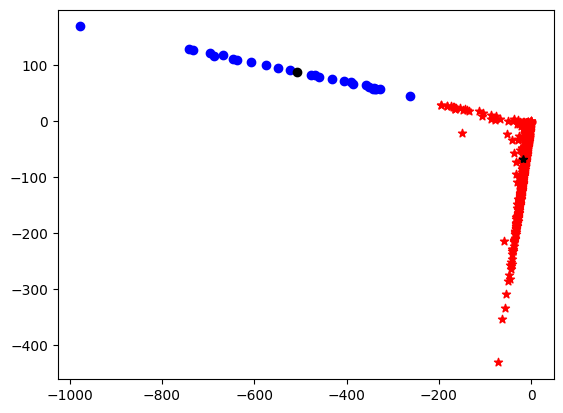

In [189]:
plt.plot(model_kmeans.centers[0]@v_t.T[:,0],model_kmeans.centers[0]@v_t.T[:,1], color='black', marker='*')
plt.plot(model_kmeans.centers[1]@v_t.T[:,0],model_kmeans.centers[1]@v_t.T[:,1], color='black', marker='o')

plt.scatter(x1,y1, color = 'r', marker='*')
plt.scatter(x2,y2, color = 'b', marker='o')


# **Extra** LSH with MinHashing

In [123]:
# create an rdd with key=(car, date) and value=[list of Device code]
trafficCar_rdd = data_rdd.filter(lambda x: x['ORIGINE_CAR_KEY'] in top_car).map(lambda x: (((x['ORIGINE_CAR_KEY'], x['PASS_DAY_TIME'].date()), x['DEVICE_CODE'])))\
                        .groupByKey().mapValues(list)
trafficCar_rdd.take(1)

[(('8334397', datetime.date(2021, 12, 24)),
  [100700804, 900167, 900218, 900239])]

In [124]:
# collect all distinct devices code in deviceCodes and then print number of them
deviceCodes = sorted(trafficCar_rdd.flatMap(lambda x: x[1]).distinct().collect())
num_deviceCode = len(deviceCodes)
print("number of distinct devices(traffic camera) = ", num_deviceCode)

number of distinct devices(traffic camera) =  284


In [125]:
# create vector of devices for each car. we use deviceCodes to create a vector of devices for each car.
# if each device code for car is not in deviceCodes it get 0 else it get 1. 
def deviceVectorize(x):
    vector_of_device = np.isin(deviceCodes, x[1])*1
    return (x, vector_of_device )


# trafficCarVector_rdd output ---->  key=((plate, Date), [device codes]) , value=[device vector]
trafficCarVector_rdd = trafficCar_rdd.map(deviceVectorize)
trafficCarVector_rdd.take(1)

[((('8334397', datetime.date(2021, 12, 24)),
   [100700804, 900167, 900218, 900239]),
  array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0,

In [126]:
# create arbitrary road vector randomly with adaptive density
randomRoad = [900151, 100700864, 900148, 900185, 100700838, 100700853, 900269, 900285, 900268, 900212]
randomRoadVector = np.isin(deviceCodes, randomRoad)*1
print(f"arbitrary Road with {len(randomRoad)} devices code :", randomRoad)

arbitrary Road with 10 devices code : [900151, 100700864, 900148, 900185, 100700838, 100700853, 900269, 900285, 900268, 900212]


In [127]:
numHyperPlane = 100
H_family = [np.random.permutation(num_deviceCode) for _ in range(numHyperPlane)] # family H with {numHyperPlane} random permutation hash function
H_family

[array([ 60, 147,  52,  77, 255,  90, 171, 204, 228,  55, 117,  67, 214,
         36,  79, 121, 108,  31,  93,  47, 110, 261, 131, 174, 177, 173,
        251,  11,  62, 222, 129,  95, 221, 227, 248, 186,  92, 254, 250,
        172, 223, 275, 207, 123, 273,  27, 265, 229, 102, 105,  81, 274,
        162, 140, 126,  41, 213, 225,  68, 230,  14, 215, 125,  24, 249,
        245, 259, 183, 241,  89,  13,  78, 137, 232, 205, 257, 276, 243,
        170, 109,  23, 143, 107, 253,  39,  82, 100, 200, 260,  66, 206,
        268,  10, 161,  53, 266, 263,   6, 144,   2, 154, 181, 197, 146,
        127, 262,   1, 201, 136, 156, 128,  74,  56, 160, 104, 247, 163,
        152, 122,  63,  97,  21, 113,  33, 239, 218,  46, 134, 179, 240,
        145, 187,  98,  37,  80,   8, 202, 167,  85, 238,   5, 124,  73,
        148, 101,  58, 157,  32, 118, 210,  15, 196, 166,  94,  42, 111,
         38, 264, 169, 114, 138,  19,  65, 203,   4, 185, 198, 233,   0,
         49,  91, 188,  35, 217, 176, 199, 195, 237

In [128]:
def minHashing(x, hashFamily):
    signature = np.ones(numHyperPlane)*np.inf
    vector = x[1]
    for i in range(len(vector)):
        for j in range(numHyperPlane):
            if vector[i] == 1 and hashFamily[j][i] < signature[j]:
                signature[j] = hashFamily[j][i]
    
    return (x[0], signature)

In [129]:
# jaccard similarity function
def jaccardSimilarity(x, vector):
    vector_car = x[1]
    sim = 1 - jaccard(vector_car, vector)
    return (x[0],sim)

In [130]:
# apply hash function (hash family) to cars road and create signature matrix 
# trafficCarVectorHash_rdd output ---->  key=((plate, Date), [device codes]) , value=signature column(vector hashed)
trafficCarVectorHash_rdd = trafficCarVector_rdd.map(lambda x: minHashing(x, H_family))
trafficCarVectorHash_rdd.take(1)

[((('8334397', datetime.date(2021, 12, 24)),
   [100700804, 900167, 900218, 900239]),
  array([ 48.,  11., 105.,  96.,  73.,  54.,  63.,  88.,  90.,  20.,  12.,
         109.,   2.,  41., 119.,  93.,  28.,  24.,  28.,  40.,  47.,  55.,
          17.,  78.,  75.,  23.,   7.,  57.,  94.,  44.,  39.,  33., 100.,
          20.,   8., 110.,  49.,  26.,  80.,  67.,  70.,  35.,   7.,  56.,
          10.,  11.,  37.,  86.,  84.,  96.,  21.,  35.,  32.,  52.,  94.,
         122.,  63.,  39.,  84.,  32.,  27.,  92., 177.,  28.,   9.,  49.,
          79.,  69.,  25.,  29.,  22., 112.,   6.,  61.,  22.,  62.,  62.,
          41.,  67.,  35.,  76.,  77.,  30.,  15.,  46.,  46.,  89.,  12.,
          17.,  12.,  57.,  96.,  34.,  47., 185.,  17.,  36.,  87.,  50.,
          73.]))]

In [131]:
# apply hash function (hash family) to arbitrary road and create signature column
# randomRoadVectorHash output ---->  key=arbitrary code , value=signature column(vector hashed)
randomRoadVectorHash = minHashing((randomRoad, randomRoadVector), H_family)
randomRoadVectorHash

([900151,
  100700864,
  900148,
  900185,
  100700838,
  100700853,
  900269,
  900285,
  900268,
  900212],
 array([21., 31.,  8.,  0., 22., 71., 54., 31., 60.,  8., 51., 41., 44.,
        70., 44., 15., 30.,  1.,  1.,  3., 25., 78., 39., 13., 16., 59.,
        58., 50.,  3.,  8., 16., 18., 16.,  7., 76.,  5.,  8., 21., 39.,
        71.,  1., 15., 17.,  3.,  7.,  9.,  2., 13.,  1.,  5., 29., 20.,
         0., 37., 72., 61.,  8., 53., 11., 26., 21.,  1., 49., 14., 45.,
        42., 18., 23.,  9., 42., 35.,  4., 11.,  0.,  8.,  1.,  0., 32.,
        19.,  7., 33., 60.,  4., 30.,  6.,  1., 11.,  6., 21., 53., 12.,
         9.,  1., 11., 32.,  5., 40.,  3., 75., 21.]))

In [132]:
r = 5    # rows 
b = 20   # bands

# r-way AND followed by b-way OR construction
# first, apply <AND> operator on all items in each band of car road signature columns and arbitrary road signature
# second, applying <OR> operator on the result of r-way AND in the last section. 
# if the result of this section is more than 0 it means that there is at least 1 bucket that has candidate pair so we set True as value.
# but if there is not candidate pair we set False as value
def findCandidate(x, vector):
    state = 0
    vector_of_device = x[1]
    for i in range(b):                                                              
        if (vector_of_device[i*r:(i+1)*r] == vector[i*r:(i+1)*r]).all(): 
            state += 1
    
    if state > 0 :
        return (x,True)
    else:
        return (x,False)

In [134]:
# the bucket consists of arbitrary road hash and car road which have the same hash
# bucket_rdd output ---->  key=((plate, Date), [device codes]) , value=signature column(vector hashed)
bucket_rdd = trafficCarVectorHash_rdd.map(lambda x: findCandidate(x, randomRoadVectorHash[1])).filter(lambda x: x[1] == True).map(lambda x: x[0])

In [135]:
# compute similarity of each item in bucket and randomRoadVectorHash
# simbucket_rdd output ---->  key=((plate, Date), [device codes]) , value=cosine similarity
simbucket_rdd = bucket_rdd.map(lambda x: jaccardSimilarity(x, randomRoadVectorHash[1]))

In [136]:
# check that how much hubs that collect in HITS (part 5) is there in bucket and then 
# output ---->  key=((plate, Date), [device codes]) , value=cosine similarity
simbucket_rdd.filter(lambda x: x[0][0][0] in list(map(lambda x: x[0], hub[:100]))).map(lambda x: (x[0][0],x[1])).collect()

[(('8550920', datetime.date(2022, 1, 15)), 0.3298969072164949),
 (('7759671', datetime.date(2022, 1, 13)), 0.33673469387755106),
 (('21118149', datetime.date(2022, 1, 14)), 0.32999999999999996),
 (('8550920', datetime.date(2021, 12, 26)), 0.3711340206185567),
 (('7734712', datetime.date(2022, 1, 5)), 0.31999999999999995),
 (('8550920', datetime.date(2022, 1, 20)), 0.3298969072164949),
 (('8550920', datetime.date(2021, 12, 28)), 0.27835051546391754),
 (('8550920', datetime.date(2022, 1, 3)), 0.4020618556701031),
 (('9590687', datetime.date(2022, 1, 18)), 0.40816326530612246),
 (('9590687', datetime.date(2022, 1, 12)), 0.40816326530612246),
 (('9590687', datetime.date(2022, 1, 11)), 0.4897959183673469),
 (('7759671', datetime.date(2022, 1, 20)), 0.2551020408163265),
 (('8550920', datetime.date(2022, 1, 4)), 0.2989690721649485),
 (('8550920', datetime.date(2022, 1, 11)), 0.31958762886597936),
 (('8557740', datetime.date(2022, 1, 14)), 0.3737373737373737),
 (('16337794', datetime.date(2021